# Building Segmentantation Experiments for XView Dataset

## Requirements

In [1]:
%%writefile requirements.txt
torch
torchvision
matplotlib
numpy
pandas
tqdm
opencv-python
albumentations
segmentation_models_pytorch
tensorboard

Writing requirements.txt


In [2]:
!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 111.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 88.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 12.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

## Imports

In [11]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import sys
sys.path.append('/content/drive/MyDrive/thesis_code/segmentation')

import warnings
warnings.filterwarnings('ignore')

Mounted at /content/drive


In [9]:
import os
import pandas as pd
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import shutil
import random
import glob
from pathlib import Path

from scripts.loader import get_exhaustive_crops_dataloaders
from scripts.utils import visualize_train_samples, visualize_predictions, label_to_rgb
from scripts.models import UNet, NestedUNet, U2NETP
from scripts.loss import HybridLoss
from scripts.train import train_model
from scripts.transforms import get_train_transform, get_test_transform
from scripts.evaluation import evaluate_model, evaluate_model_with_regularization, update_experiment_results_csv, print_regularization_metrics
from scripts.regularize import Encoder, GeneratorResNet

## Data Retrieval

In [7]:
!unzip "/content/drive/MyDrive/thesis_code/segmentation/data/x_view_segm.zip"

Показано результат, скорочений до останніх рядків (5000).
  inflating: data/train/images/santa-rosa-wildfire_00000090_pre_disaster.png  
  inflating: data/train/images/midwest-flooding_00000038_pre_disaster.png  
  inflating: data/train/images/santa-rosa-wildfire_00000059_pre_disaster.png  
  inflating: data/train/images/santa-rosa-wildfire_00000018_pre_disaster.png  
  inflating: data/train/images/hurricane-matthew_00000312_pre_disaster.png  
  inflating: data/train/images/midwest-flooding_00000041_pre_disaster.png  
  inflating: data/train/images/hurricane-harvey_00000514_pre_disaster.png  
  inflating: data/train/images/socal-fire_00000945_pre_disaster.png  
  inflating: data/train/images/hurricane-harvey_00000315_pre_disaster.png  
  inflating: data/train/images/hurricane-florence_00000026_pre_disaster.png  
  inflating: data/train/images/socal-fire_00000591_pre_disaster.png  
  inflating: data/train/images/socal-fire_00001135_pre_disaster.png  
  inflating: data/train/images/santa

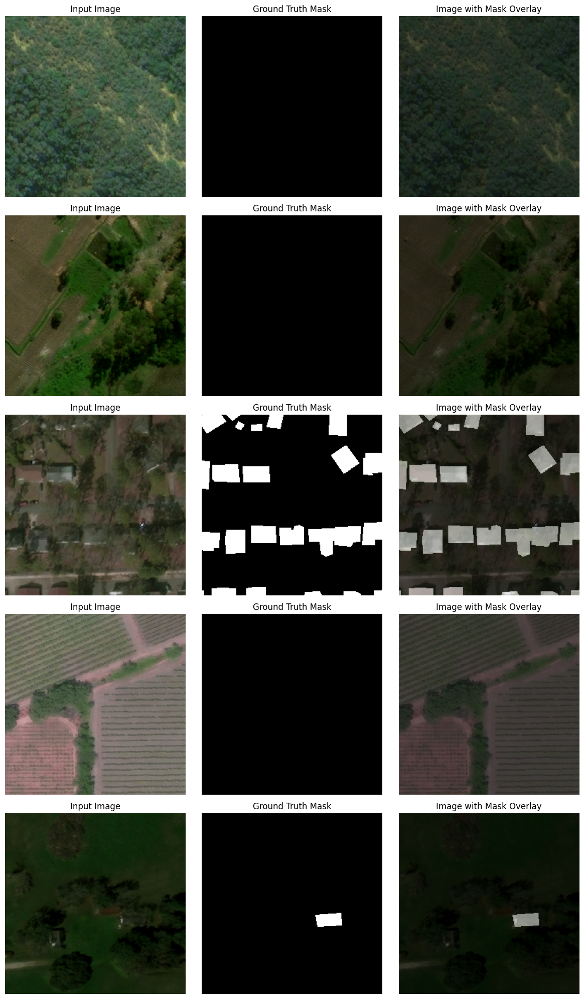

In [8]:
DATA_DIR = '/content/data/'
x_train_dir = os.path.join(DATA_DIR, 'train/images')
y_train_dir = os.path.join(DATA_DIR, 'train/targets')
x_valid_dir = os.path.join(DATA_DIR, 'val/images')
y_valid_dir = os.path.join(DATA_DIR, 'val/targets')
x_test_dir = os.path.join(DATA_DIR, 'test/images')
y_test_dir = os.path.join(DATA_DIR, 'test/targets')

class_rgb_values = [[0, 0, 0], [1, 1, 1]]

train_transform = get_train_transform(use_crop=False, use_color_transforms=True)
test_transform = get_test_transform(min_size=(1024, 1024))

# Get dataloaders
train_loader, valid_loader, test_loader = get_exhaustive_crops_dataloaders(
     x_train_dir, y_train_dir, x_valid_dir, y_valid_dir, x_test_dir, y_test_dir, class_rgb_values, train_transform=train_transform, test_transform=test_transform)

# Visualize samples
visualize_train_samples(train_loader, [[0, 0, 0], [255, 255, 255]])

## Experiments

### UNet

#### Training

In [ ]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_Unet = UNet().to(DEVICE)
loss_fn = HybridLoss()
optimizer = torch.optim.Adam([dict(params=model_Unet.parameters(), lr=1e-4)])
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=1, T_mult=2, eta_min=5e-5)

In [ ]:
checkpoint_path = "/content/drive/MyDrive/thesis_code/segmentation/models/model_UNet_XView_30.pt"
checkpoint = torch.load(checkpoint_path, map_location=DEVICE)

# Load model weights
model_Unet.load_state_dict(checkpoint["model_state"])

# Load optimizer state
optimizer.load_state_dict(checkpoint["optimizer_state"])

# Load scheduler state
lr_scheduler.load_state_dict(checkpoint["scheduler_state"])

In [ ]:
train_logs, valid_logs = train_model(model_Unet, train_loader, valid_loader, loss_fn, optimizer, lr_scheduler, epochs=10, device=DEVICE, exp_num=0) #resuming from 30 epoch

Epoch 1/10


100%|██████████| 230/230 [05:11<00:00,  1.35s/it]


Epoch 1:
  Train Loss: 0.1439, Precision: 0.8691, Recall: 0.8526, F1: 0.8595, IoU: 0.7555
  Val Loss: 0.1472, Precision: 0.8310, Recall: 0.7745, F1: 0.7910, IoU: 0.6826
Epoch 2/10


100%|██████████| 230/230 [05:10<00:00,  1.35s/it]


Epoch 2:
  Train Loss: 0.1561, Precision: 0.8585, Recall: 0.8409, F1: 0.8476, IoU: 0.7379
  Val Loss: 0.1576, Precision: 0.7936, Recall: 0.7886, F1: 0.7809, IoU: 0.6699
Epoch 3/10


100%|██████████| 230/230 [04:59<00:00,  1.30s/it]


Epoch 3:
  Train Loss: 0.1531, Precision: 0.8612, Recall: 0.8440, F1: 0.8508, IoU: 0.7425
  Val Loss: 0.1665, Precision: 0.8172, Recall: 0.7244, F1: 0.7552, IoU: 0.6460
Epoch 4/10


100%|██████████| 230/230 [05:02<00:00,  1.32s/it]


Epoch 4:
  Train Loss: 0.1532, Precision: 0.8606, Recall: 0.8436, F1: 0.8504, IoU: 0.7419
  Val Loss: 0.1537, Precision: 0.8376, Recall: 0.7450, F1: 0.7803, IoU: 0.6702
Epoch 5/10


100%|██████████| 230/230 [05:03<00:00,  1.32s/it]


Epoch 5:
  Train Loss: 0.1523, Precision: 0.8625, Recall: 0.8444, F1: 0.8516, IoU: 0.7437
  Val Loss: 0.1519, Precision: 0.8198, Recall: 0.7725, F1: 0.7814, IoU: 0.6722
Epoch 6/10


100%|██████████| 230/230 [05:02<00:00,  1.32s/it]


Epoch 6:
  Train Loss: 0.1499, Precision: 0.8648, Recall: 0.8460, F1: 0.8536, IoU: 0.7468
  Val Loss: 0.1699, Precision: 0.7792, Recall: 0.7680, F1: 0.7570, IoU: 0.6453
Epoch 7/10


100%|██████████| 230/230 [05:04<00:00,  1.32s/it]


Epoch 7:
  Train Loss: 0.1482, Precision: 0.8656, Recall: 0.8492, F1: 0.8558, IoU: 0.7500
  Val Loss: 0.1506, Precision: 0.8243, Recall: 0.7667, F1: 0.7856, IoU: 0.6781
Epoch 8/10


100%|██████████| 230/230 [05:05<00:00,  1.33s/it]


Epoch 8:
  Train Loss: 0.1483, Precision: 0.8653, Recall: 0.8493, F1: 0.8558, IoU: 0.7500
  Val Loss: 0.1505, Precision: 0.7975, Recall: 0.7867, F1: 0.7849, IoU: 0.6786
Epoch 9/10


100%|██████████| 230/230 [05:07<00:00,  1.34s/it]


Epoch 9:
  Train Loss: 0.1458, Precision: 0.8686, Recall: 0.8501, F1: 0.8578, IoU: 0.7531
  Val Loss: 0.1544, Precision: 0.8416, Recall: 0.7500, F1: 0.7839, IoU: 0.6763
Epoch 10/10


100%|██████████| 230/230 [05:07<00:00,  1.34s/it]

Epoch 10:
  Train Loss: 0.1442, Precision: 0.8700, Recall: 0.8522, F1: 0.8596, IoU: 0.7557
  Val Loss: 0.1522, Precision: 0.8135, Recall: 0.7659, F1: 0.7780, IoU: 0.6710


In [ ]:
checkpoint = {
    "epoch": 40,
    "model_state": model_Unet.state_dict(),
    "optimizer_state": optimizer.state_dict(),
    "scheduler_state": lr_scheduler.state_dict(),
    }

torch.save(checkpoint, f"/content/drive/MyDrive/thesis_code/segmentation/models/model_UNet_XView_40.pt")

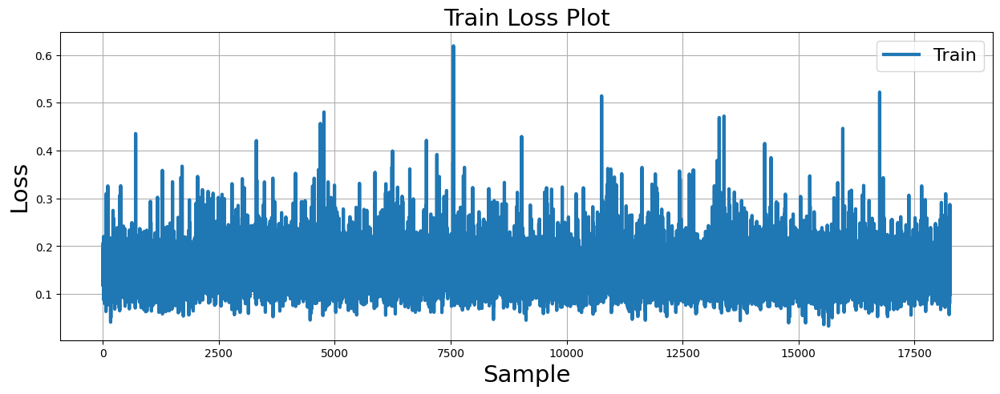

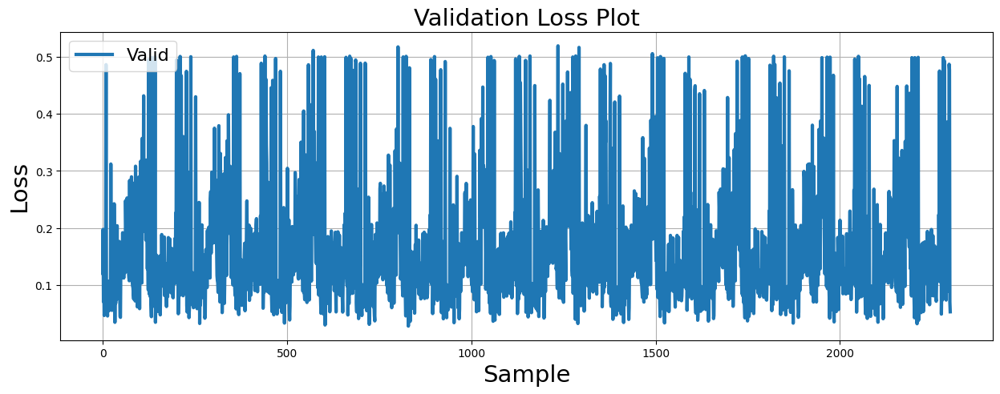

In [ ]:
plt.figure(figsize=(15, 5))
plt.plot(train_logs, lw=3, label='Train')
plt.xlabel('Sample', fontsize=21)
plt.ylabel('Loss', fontsize=21)
plt.title('Train Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.show()
plt.figure(figsize=(15, 5))
plt.plot(valid_logs, lw=3, label='Valid')
plt.xlabel('Sample', fontsize=21)
plt.ylabel('Loss', fontsize=21)
plt.title('Validation Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.show()

#### Evaluation

In [13]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_Unet = UNet().to(DEVICE)
loss_fn = HybridLoss()

checkpoint_path = "/content/drive/MyDrive/thesis_code/segmentation/models/model_UNet_XView_40.pt"
checkpoint = torch.load(checkpoint_path, map_location=DEVICE)

# Load model weights
model_Unet.load_state_dict(checkpoint["model_state"])

encoder = Encoder().to(DEVICE)
generator = GeneratorResNet().to(DEVICE)

encoder.load_state_dict(torch.load("/content/drive/MyDrive/thesis_code/segmentation/models/E140000_e1"))
generator.load_state_dict(torch.load("/content/drive/MyDrive/thesis_code/segmentation/models/E140000_net"))

<All keys matched successfully>

100%|██████████| 226/226 [05:31<00:00,  1.47s/it]


=== Before Regularization ===
Confusion matrix:
[[2.15361882e+08 2.70165800e+06]
 [2.67915100e+06 1.62354850e+07]]
Precision: 0.8408
Recall: 0.7872
F1 score: 0.7991
IOU: 0.6857

=== After Regularization ===
Confusion matrix:
[[2.14736194e+08 3.32734600e+06]
 [2.42550400e+06 1.64891320e+07]]
Precision: 0.8086
Recall: 0.7930
F1 score: 0.7884
IOU: 0.6698

=== Instance-Level Metrics ===

=== Before Regularization ===
Average IoU per building: 0.6312
Total target buildings: 11441
Total predicted buildings: 13290
Total successful buildings: 7541
Success Rate: 65.91%
Error Rate: 50.25%

=== After Regularization ===
Average IoU per building: 0.5814
Total target buildings: 11441
Total predicted buildings: 10154
Total successful buildings: 6888
Success Rate: 60.20%
Error Rate: 28.55%


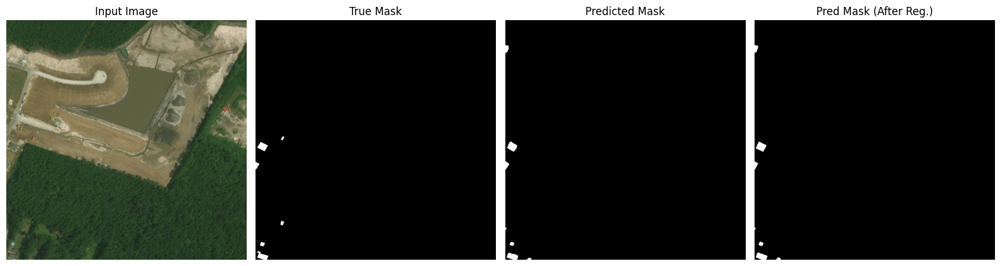

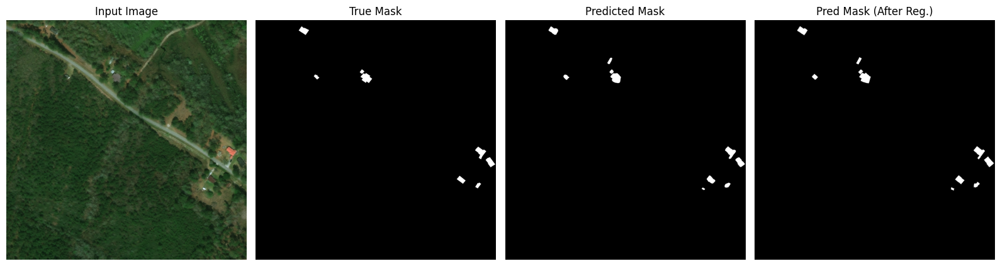

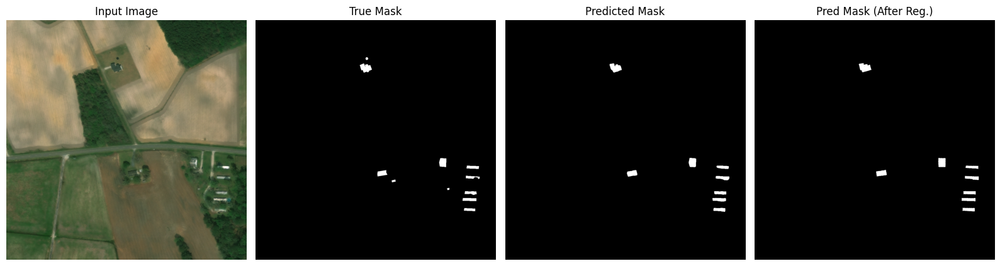

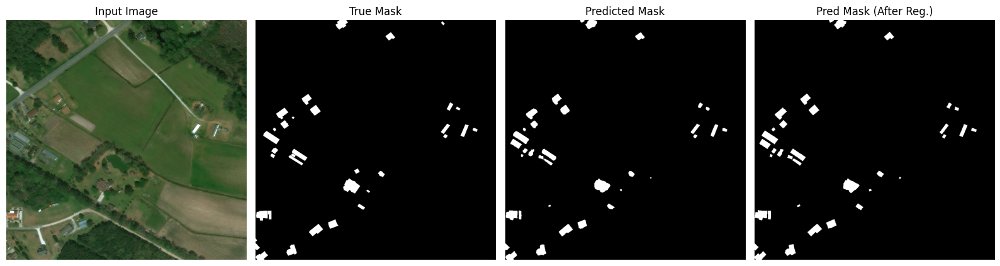

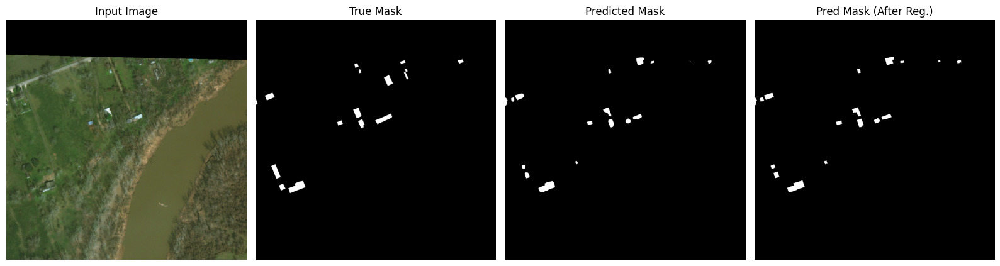

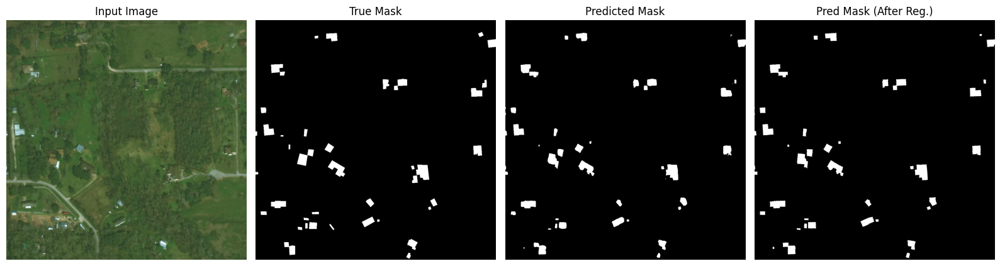

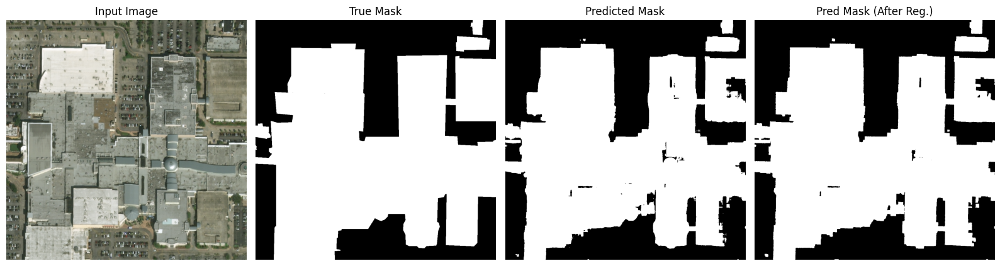

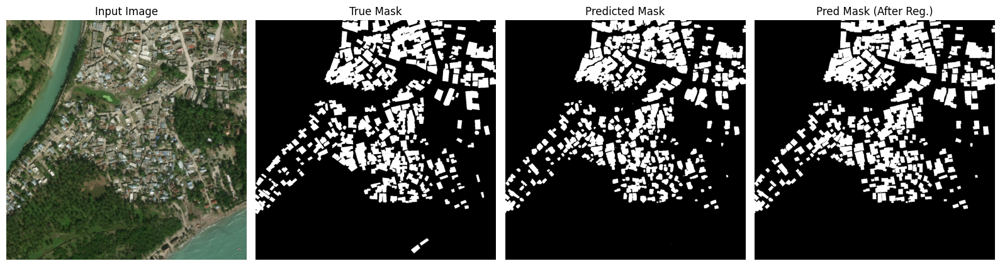

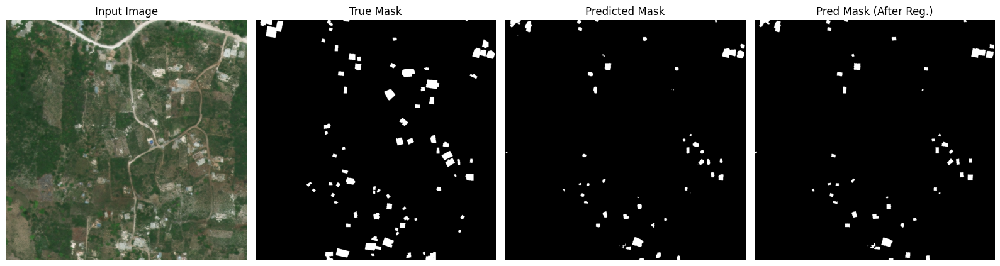

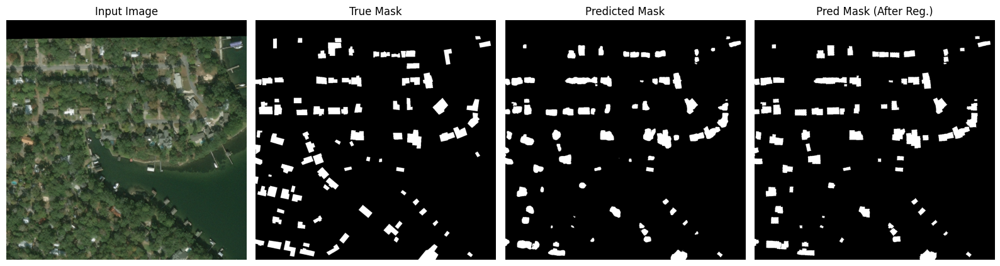

In [16]:
predictions, metrics = evaluate_model_with_regularization(model_Unet, encoder, generator, test_loader, DEVICE, [(0, 0, 0), (255, 255, 255)])

print_regularization_metrics(metrics)

visualize_predictions(predictions)

### U-Net++

#### Training

In [ ]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_NestedUnet = NestedUNet(2).to(DEVICE)
loss_fn = HybridLoss()
optimizer = torch.optim.Adam([dict(params=model_NestedUnet.parameters(), lr=1e-4)])
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=1, T_mult=2, eta_min=5e-5)

In [ ]:
checkpoint_path = "/content/drive/MyDrive/thesis_code/segmentation/models/model_UNetPlusPlus_XView_10.pt"
checkpoint = torch.load(checkpoint_path, map_location=DEVICE)

# Load model weights
model_NestedUnet.load_state_dict(checkpoint["model_state"])

# Load optimizer state
optimizer.load_state_dict(checkpoint["optimizer_state"])

# Load scheduler state
lr_scheduler.load_state_dict(checkpoint["scheduler_state"])

In [ ]:
train_logs, valid_logs = train_model(model_NestedUnet, train_loader, valid_loader, loss_fn, optimizer, lr_scheduler, epochs=20, device=DEVICE, exp_num=1) #resuming from epoch 10

Epoch 1/20


100%|██████████| 230/230 [01:52<00:00,  2.04it/s]


Epoch 1:
  Train Loss: 0.1956, Precision: 0.8229, Recall: 0.8004, F1: 0.8081, IoU: 0.6814
  Val Loss: 0.2245, Precision: 0.7579, Recall: 0.7624, F1: 0.7428, IoU: 0.6269
Epoch 2/20


100%|██████████| 230/230 [01:51<00:00,  2.06it/s]


Epoch 2:
  Train Loss: 0.1886, Precision: 0.8287, Recall: 0.8072, F1: 0.8147, IoU: 0.6906
  Val Loss: 0.2102, Precision: 0.7980, Recall: 0.7521, F1: 0.7595, IoU: 0.6448
Epoch 3/20


100%|██████████| 230/230 [01:52<00:00,  2.05it/s]


Epoch 3:
  Train Loss: 0.1825, Precision: 0.8338, Recall: 0.8140, F1: 0.8211, IoU: 0.6994
  Val Loss: 0.2058, Precision: 0.7959, Recall: 0.7630, F1: 0.7665, IoU: 0.6539
Epoch 4/20


100%|██████████| 230/230 [01:50<00:00,  2.07it/s]


Epoch 4:
  Train Loss: 0.1778, Precision: 0.8395, Recall: 0.8169, F1: 0.8258, IoU: 0.7060
  Val Loss: 0.2061, Precision: 0.8141, Recall: 0.7331, F1: 0.7601, IoU: 0.6492
Epoch 5/20


100%|██████████| 230/230 [01:51<00:00,  2.07it/s]


Epoch 5:
  Train Loss: 0.1748, Precision: 0.8412, Recall: 0.8206, F1: 0.8285, IoU: 0.7097
  Val Loss: 0.2005, Precision: 0.7855, Recall: 0.7824, F1: 0.7721, IoU: 0.6624
Epoch 6/20


100%|██████████| 230/230 [01:51<00:00,  2.05it/s]


Epoch 6:
  Train Loss: 0.1861, Precision: 0.8321, Recall: 0.8104, F1: 0.8180, IoU: 0.6949
  Val Loss: 0.2138, Precision: 0.8084, Recall: 0.7341, F1: 0.7549, IoU: 0.6410
Epoch 7/20


100%|██████████| 230/230 [01:50<00:00,  2.08it/s]


Epoch 7:
  Train Loss: 0.1820, Precision: 0.8350, Recall: 0.8144, F1: 0.8216, IoU: 0.7005
  Val Loss: 0.2087, Precision: 0.7701, Recall: 0.7779, F1: 0.7630, IoU: 0.6499
Epoch 8/20


100%|██████████| 230/230 [01:50<00:00,  2.08it/s]


Epoch 8:
  Train Loss: 0.1796, Precision: 0.8372, Recall: 0.8165, F1: 0.8241, IoU: 0.7037
  Val Loss: 0.2046, Precision: 0.7982, Recall: 0.7551, F1: 0.7665, IoU: 0.6551
Epoch 9/20


100%|██████████| 230/230 [01:52<00:00,  2.05it/s]


Epoch 9:
  Train Loss: 0.1770, Precision: 0.8396, Recall: 0.8193, F1: 0.8267, IoU: 0.7075
  Val Loss: 0.1993, Precision: 0.8184, Recall: 0.7444, F1: 0.7678, IoU: 0.6557
Epoch 10/20


100%|██████████| 230/230 [01:51<00:00,  2.06it/s]


Epoch 10:
  Train Loss: 0.1747, Precision: 0.8418, Recall: 0.8222, F1: 0.8294, IoU: 0.7113
  Val Loss: 0.2122, Precision: 0.8114, Recall: 0.7429, F1: 0.7641, IoU: 0.6481
Epoch 11/20


100%|██████████| 230/230 [01:51<00:00,  2.06it/s]


Epoch 11:
  Train Loss: 0.1714, Precision: 0.8451, Recall: 0.8231, F1: 0.8318, IoU: 0.7146
  Val Loss: 0.2017, Precision: 0.8104, Recall: 0.7484, F1: 0.7695, IoU: 0.6591
Epoch 12/20


100%|██████████| 230/230 [01:52<00:00,  2.05it/s]


Epoch 12:
  Train Loss: 0.1694, Precision: 0.8467, Recall: 0.8266, F1: 0.8342, IoU: 0.7183
  Val Loss: 0.1997, Precision: 0.8213, Recall: 0.7409, F1: 0.7693, IoU: 0.6593
Epoch 13/20


100%|██████████| 230/230 [01:51<00:00,  2.06it/s]


Epoch 13:
  Train Loss: 0.1664, Precision: 0.8495, Recall: 0.8297, F1: 0.8374, IoU: 0.7228
  Val Loss: 0.2017, Precision: 0.7887, Recall: 0.7771, F1: 0.7707, IoU: 0.6596
Epoch 14/20


100%|██████████| 230/230 [01:51<00:00,  2.07it/s]


Epoch 14:
  Train Loss: 0.1638, Precision: 0.8518, Recall: 0.8323, F1: 0.8398, IoU: 0.7264
  Val Loss: 0.1977, Precision: 0.8214, Recall: 0.7448, F1: 0.7693, IoU: 0.6601
Epoch 15/20


100%|██████████| 230/230 [01:51<00:00,  2.07it/s]


Epoch 15:
  Train Loss: 0.1600, Precision: 0.8552, Recall: 0.8361, F1: 0.8436, IoU: 0.7319
  Val Loss: 0.1919, Precision: 0.8193, Recall: 0.7730, F1: 0.7857, IoU: 0.6738
Epoch 16/20


100%|██████████| 230/230 [01:48<00:00,  2.11it/s]


Epoch 16:
  Train Loss: 0.1583, Precision: 0.8564, Recall: 0.8379, F1: 0.8452, IoU: 0.7342
  Val Loss: 0.1902, Precision: 0.8265, Recall: 0.7479, F1: 0.7780, IoU: 0.6711
Epoch 17/20


100%|██████████| 230/230 [01:52<00:00,  2.04it/s]


Epoch 17:
  Train Loss: 0.1568, Precision: 0.8580, Recall: 0.8386, F1: 0.8465, IoU: 0.7361
  Val Loss: 0.1891, Precision: 0.8135, Recall: 0.7725, F1: 0.7836, IoU: 0.6755
Epoch 18/20


100%|██████████| 230/230 [01:52<00:00,  2.04it/s]


Epoch 18:
  Train Loss: 0.1544, Precision: 0.8603, Recall: 0.8406, F1: 0.8487, IoU: 0.7395
  Val Loss: 0.1851, Precision: 0.8151, Recall: 0.7857, F1: 0.7898, IoU: 0.6824
Epoch 19/20


100%|██████████| 230/230 [01:51<00:00,  2.06it/s]


Epoch 19:
  Train Loss: 0.1531, Precision: 0.8612, Recall: 0.8434, F1: 0.8506, IoU: 0.7423
  Val Loss: 0.1858, Precision: 0.8172, Recall: 0.7795, F1: 0.7867, IoU: 0.6799
Epoch 20/20


100%|██████████| 230/230 [01:51<00:00,  2.05it/s]

Epoch 20:
  Train Loss: 0.1521, Precision: 0.8622, Recall: 0.8433, F1: 0.8510, IoU: 0.7431
  Val Loss: 0.1835, Precision: 0.8291, Recall: 0.7788, F1: 0.7912, IoU: 0.6864


In [ ]:
checkpoint = {
    "epoch": 30,
    "model_state": model_NestedUnet.state_dict(),
    "optimizer_state": optimizer.state_dict(),
    "scheduler_state": lr_scheduler.state_dict(),
    }

torch.save(checkpoint, f"/content/drive/MyDrive/thesis_code/segmentation/models/model_UNetPlusPlus_XView_30.pt")

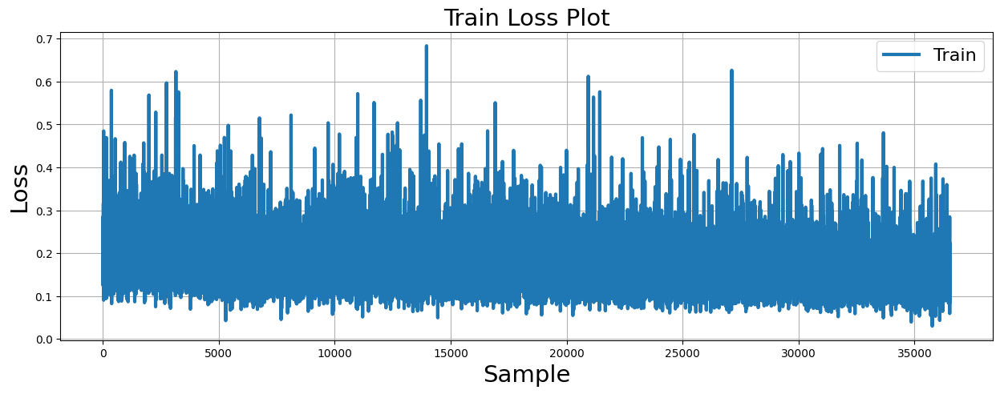

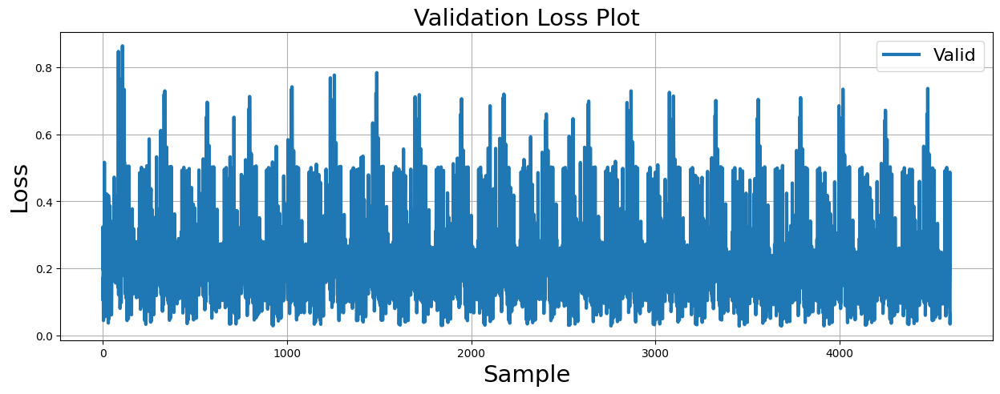

In [ ]:
plt.figure(figsize=(15, 5))
plt.plot(train_logs, lw=3, label='Train')
plt.xlabel('Sample', fontsize=21)
plt.ylabel('Loss', fontsize=21)
plt.title('Train Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.show()
plt.figure(figsize=(15, 5))
plt.plot(valid_logs, lw=3, label='Valid')
plt.xlabel('Sample', fontsize=21)
plt.ylabel('Loss', fontsize=21)
plt.title('Validation Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.show()

#### Evaluation

In [18]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_NestedUnet = NestedUNet(2).to(DEVICE)

checkpoint_path = "/content/drive/MyDrive/thesis_code/segmentation/models/model_UNetPlusPlus_XView_30.pt"
checkpoint = torch.load(checkpoint_path, map_location=DEVICE)

# Load model weights
model_NestedUnet.load_state_dict(checkpoint["model_state"])

encoder = Encoder().to(DEVICE)
generator = GeneratorResNet().to(DEVICE)

encoder.load_state_dict(torch.load("/content/drive/MyDrive/thesis_code/segmentation/models/E140000_e1"))
generator.load_state_dict(torch.load("/content/drive/MyDrive/thesis_code/segmentation/models/E140000_net"))

<All keys matched successfully>

100%|██████████| 226/226 [05:30<00:00,  1.46s/it]


=== Before Regularization ===
Confusion matrix:
[[2.15347518e+08 2.71602200e+06]
 [2.80495900e+06 1.61096770e+07]]
Precision: 0.8332
Recall: 0.7830
F1 score: 0.7952
IOU: 0.6816

=== After Regularization ===
Confusion matrix:
[[2.14742284e+08 3.32125600e+06]
 [2.56180900e+06 1.63528270e+07]]
Precision: 0.8028
Recall: 0.7892
F1 score: 0.7846
IOU: 0.6663

=== Instance-Level Metrics ===

=== Before Regularization ===
Average IoU per building: 0.6156
Total target buildings: 11441
Total predicted buildings: 13039
Total successful buildings: 7327
Success Rate: 64.04%
Error Rate: 49.93%

=== After Regularization ===
Average IoU per building: 0.5740
Total target buildings: 11441
Total predicted buildings: 10037
Total successful buildings: 6785
Success Rate: 59.30%
Error Rate: 28.42%


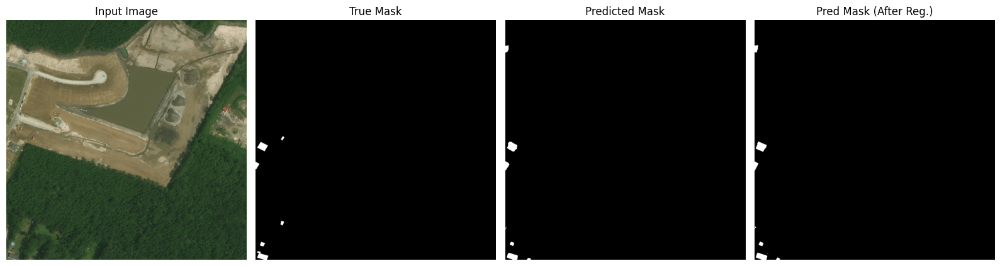

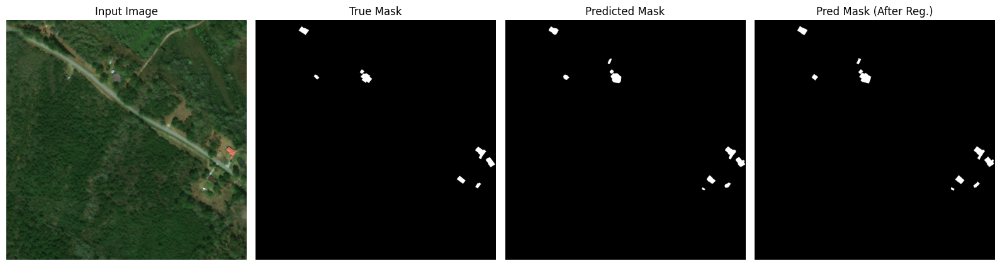

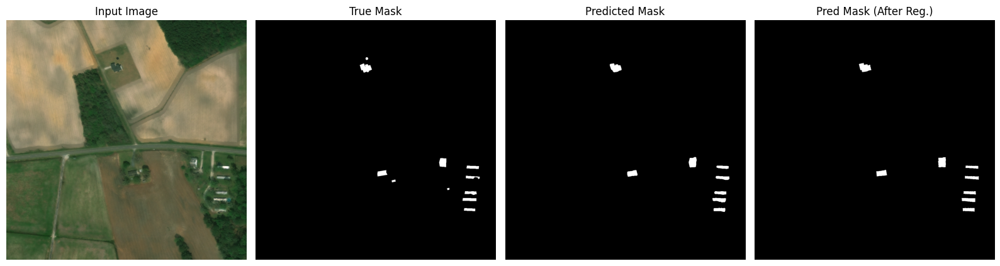

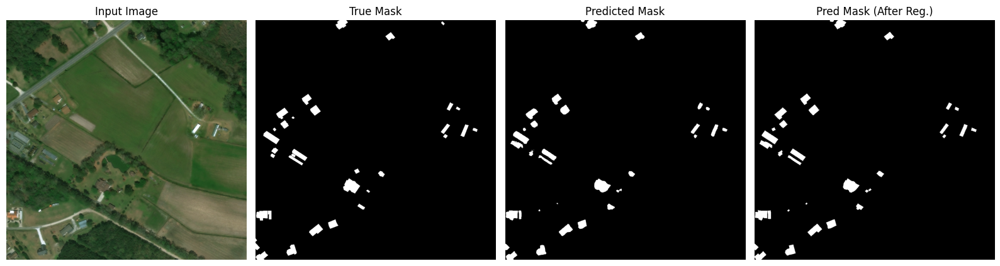

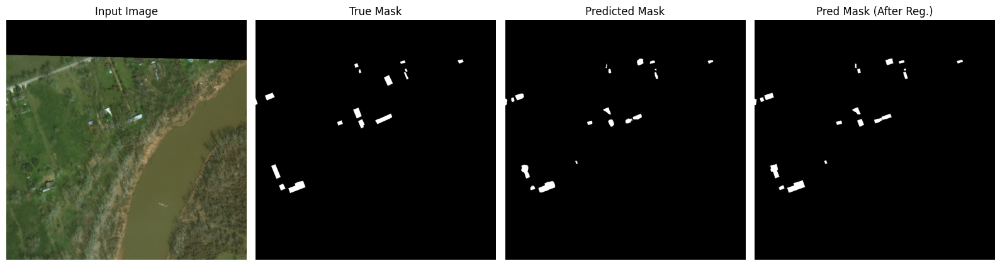

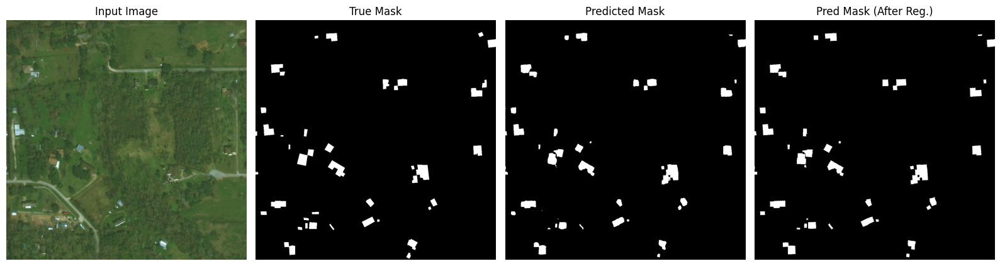

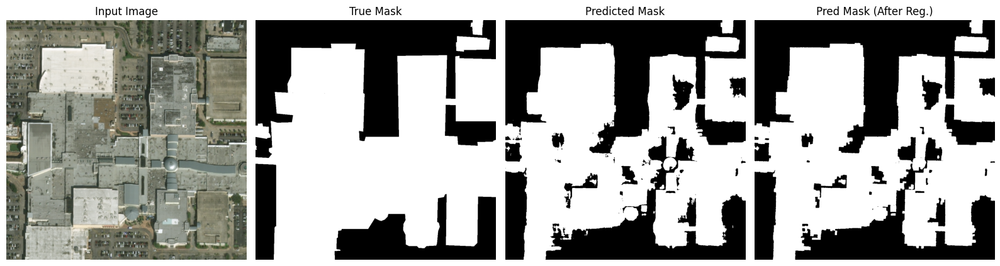

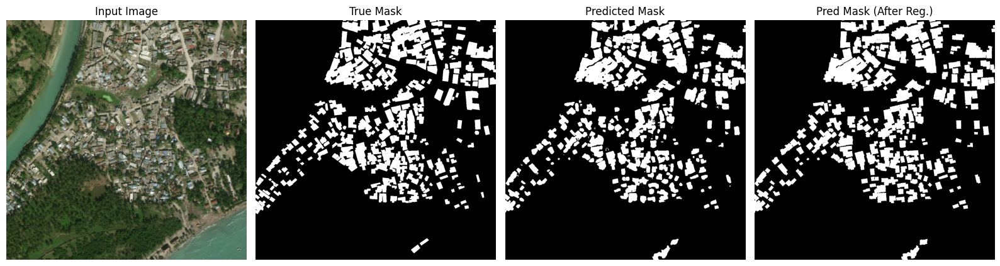

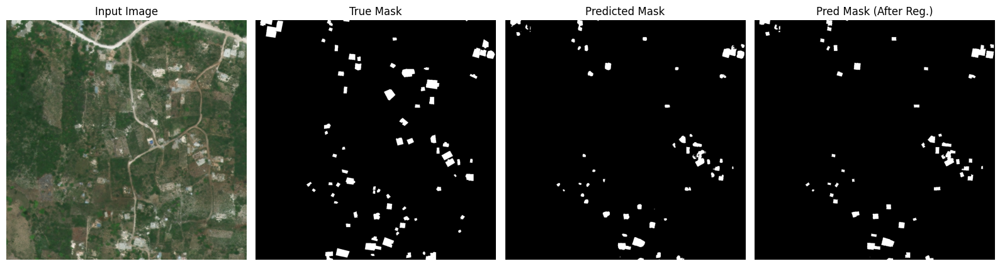

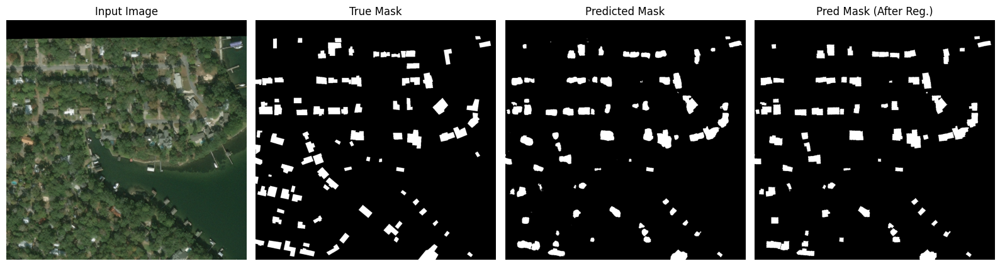

In [19]:
predictions, metrics = evaluate_model_with_regularization(model_NestedUnet, encoder, generator, test_loader, DEVICE, [(0, 0, 0), (255, 255, 255)])

print_regularization_metrics(metrics)

visualize_predictions(predictions)

### U^2-Net

#### Training

In [ ]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_U2net = U2NETP(in_ch=3, out_ch=2).to(DEVICE)
loss_fn = HybridLoss()
optimizer = torch.optim.Adam([dict(params=model_U2net.parameters(), lr=1e-4)])
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=1, T_mult=2, eta_min=5e-5)

In [ ]:
checkpoint_path = "/content/drive/MyDrive/thesis_code/segmentation/models/model_U2Net_XView_10.pt"
checkpoint = torch.load(checkpoint_path, map_location=DEVICE)

# Load model weights
model_U2net.load_state_dict(checkpoint["model_state"])

# Load optimizer state
optimizer.load_state_dict(checkpoint["optimizer_state"])

# Load scheduler state
lr_scheduler.load_state_dict(checkpoint["scheduler_state"])

In [ ]:
train_logs, valid_logs = train_model(model_U2net, train_loader, valid_loader, loss_fn, optimizer, lr_scheduler, epochs=10, device=DEVICE, exp_num=0) #resuming from 10th epoch

Epoch 1/10


100%|██████████| 230/230 [01:07<00:00,  3.41it/s]


Epoch 1:
  Train Loss: 0.2111, Precision: 0.8087, Recall: 0.7853, F1: 0.7933, IoU: 0.6608
  Val Loss: 0.2365, Precision: 0.7910, Recall: 0.7003, F1: 0.7268, IoU: 0.6023
Epoch 2/10


100%|██████████| 230/230 [01:07<00:00,  3.42it/s]


Epoch 2:
  Train Loss: 0.2058, Precision: 0.8118, Recall: 0.7914, F1: 0.7982, IoU: 0.6675
  Val Loss: 0.2325, Precision: 0.7677, Recall: 0.7278, F1: 0.7338, IoU: 0.6137
Epoch 3/10


100%|██████████| 230/230 [01:07<00:00,  3.43it/s]


Epoch 3:
  Train Loss: 0.2033, Precision: 0.8152, Recall: 0.7921, F1: 0.8003, IoU: 0.6708
  Val Loss: 0.2325, Precision: 0.7773, Recall: 0.7353, F1: 0.7456, IoU: 0.6255
Epoch 4/10


100%|██████████| 230/230 [01:06<00:00,  3.45it/s]


Epoch 4:
  Train Loss: 0.1964, Precision: 0.8207, Recall: 0.7999, F1: 0.8073, IoU: 0.6803
  Val Loss: 0.2420, Precision: 0.8016, Recall: 0.7021, F1: 0.7358, IoU: 0.6112
Epoch 5/10


100%|██████████| 230/230 [01:07<00:00,  3.42it/s]


Epoch 5:
  Train Loss: 0.1909, Precision: 0.8266, Recall: 0.8047, F1: 0.8132, IoU: 0.6881
  Val Loss: 0.2569, Precision: 0.8053, Recall: 0.6712, F1: 0.7193, IoU: 0.5949
Epoch 6/10


100%|██████████| 230/230 [01:07<00:00,  3.43it/s]


Epoch 6:
  Train Loss: 0.2039, Precision: 0.8157, Recall: 0.7918, F1: 0.7999, IoU: 0.6703
  Val Loss: 0.3605, Precision: 0.7989, Recall: 0.5733, F1: 0.6354, IoU: 0.4983
Epoch 7/10


100%|██████████| 230/230 [01:06<00:00,  3.43it/s]


Epoch 7:
  Train Loss: 0.1996, Precision: 0.8200, Recall: 0.7962, F1: 0.8046, IoU: 0.6763
  Val Loss: 0.2424, Precision: 0.7920, Recall: 0.7118, F1: 0.7378, IoU: 0.6147
Epoch 8/10


100%|██████████| 230/230 [01:07<00:00,  3.42it/s]


Epoch 8:
  Train Loss: 0.1965, Precision: 0.8214, Recall: 0.7998, F1: 0.8074, IoU: 0.6804
  Val Loss: 0.2736, Precision: 0.8109, Recall: 0.6130, F1: 0.6781, IoU: 0.5516
Epoch 9/10


100%|██████████| 230/230 [01:06<00:00,  3.43it/s]


Epoch 9:
  Train Loss: 0.1922, Precision: 0.8262, Recall: 0.8028, F1: 0.8115, IoU: 0.6860
  Val Loss: 0.2804, Precision: 0.8161, Recall: 0.6745, F1: 0.7200, IoU: 0.5924
Epoch 10/10


100%|██████████| 230/230 [01:06<00:00,  3.44it/s]

Epoch 10:
  Train Loss: 0.1939, Precision: 0.8238, Recall: 0.8024, F1: 0.8100, IoU: 0.6841
  Val Loss: 0.4866, Precision: 0.8200, Recall: 0.4558, F1: 0.5482, IoU: 0.4253


In [ ]:
checkpoint = {
    "epoch": 20,
    "model_state": model_U2net.state_dict(),
    "optimizer_state": optimizer.state_dict(),
    "scheduler_state": lr_scheduler.state_dict(),
    }

torch.save(checkpoint, f"/content/drive/MyDrive/thesis_code/segmentation/models/model_U2Net_XView_20.pt")

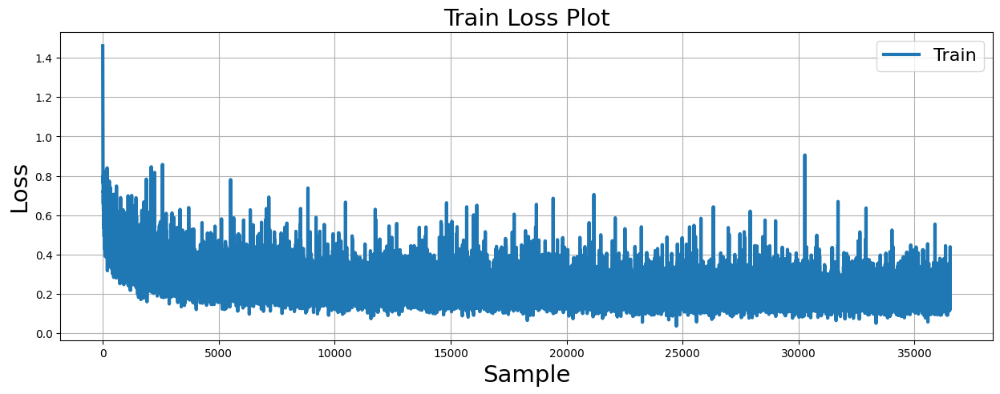

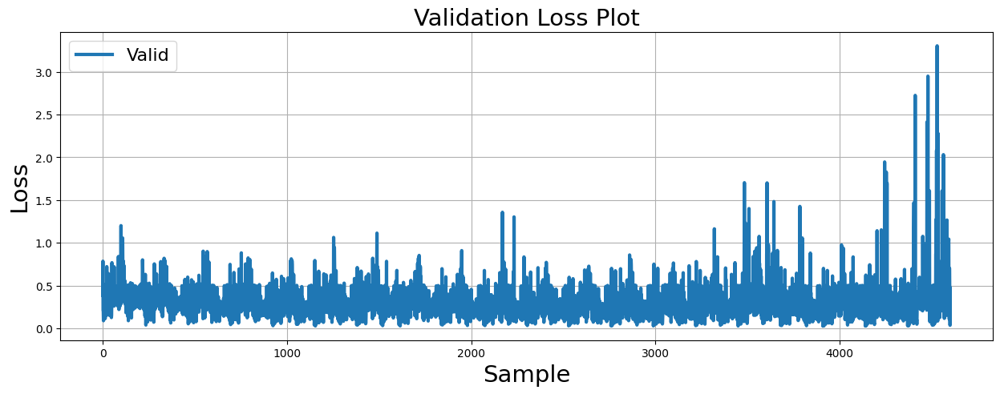

In [ ]:
plt.figure(figsize=(15, 5))
plt.plot(train_logs, lw=3, label='Train')
plt.xlabel('Sample', fontsize=21)
plt.ylabel('Loss', fontsize=21)
plt.title('Train Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.show()
plt.figure(figsize=(15, 5))
plt.plot(valid_logs, lw=3, label='Valid')
plt.xlabel('Sample', fontsize=21)
plt.ylabel('Loss', fontsize=21)
plt.title('Validation Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.show()

#### Evaluation

In [20]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_U2net = U2NETP(in_ch=3, out_ch=2).to(DEVICE)

checkpoint_path = "/content/drive/MyDrive/thesis_code/segmentation/models/model_U2Net_XView_10.pt"
checkpoint = torch.load(checkpoint_path, map_location=DEVICE)

# Load model weights
model_U2net.load_state_dict(checkpoint["model_state"])

encoder = Encoder().to(DEVICE)
generator = GeneratorResNet().to(DEVICE)

encoder.load_state_dict(torch.load("/content/drive/MyDrive/thesis_code/segmentation/models/E140000_e1"))
generator.load_state_dict(torch.load("/content/drive/MyDrive/thesis_code/segmentation/models/E140000_net"))

<All keys matched successfully>

100%|██████████| 226/226 [05:08<00:00,  1.36s/it]


=== Before Regularization ===
Confusion matrix:
[[2.14332411e+08 3.73112900e+06]
 [3.78645800e+06 1.51281780e+07]]
Precision: 0.7654
Recall: 0.7327
F1 score: 0.7347
IOU: 0.6063

=== After Regularization ===
Confusion matrix:
[[2.13694686e+08 4.36885400e+06]
 [3.57995600e+06 1.53346800e+07]]
Precision: 0.7390
Recall: 0.7379
F1 score: 0.7250
IOU: 0.5926

=== Instance-Level Metrics ===

=== Before Regularization ===
Average IoU per building: 0.5220
Total target buildings: 11441
Total predicted buildings: 11357
Total successful buildings: 5933
Success Rate: 51.86%
Error Rate: 47.41%

=== After Regularization ===
Average IoU per building: 0.4905
Total target buildings: 11441
Total predicted buildings: 9741
Total successful buildings: 5588
Success Rate: 48.84%
Error Rate: 36.30%


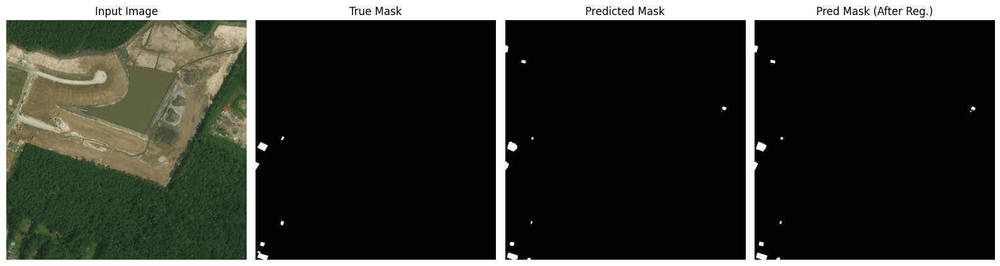

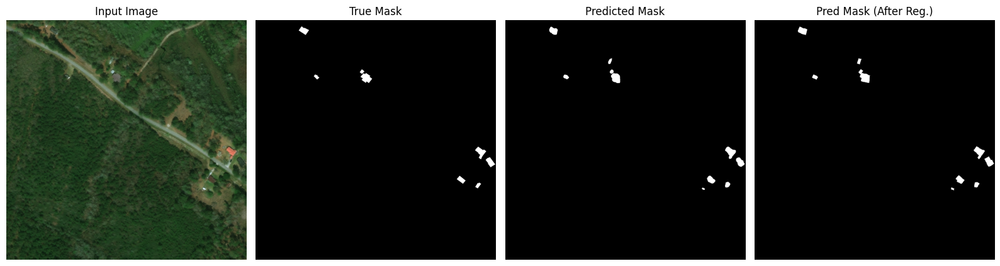

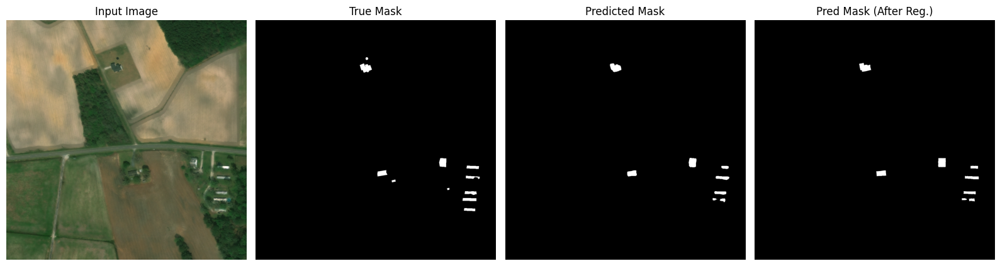

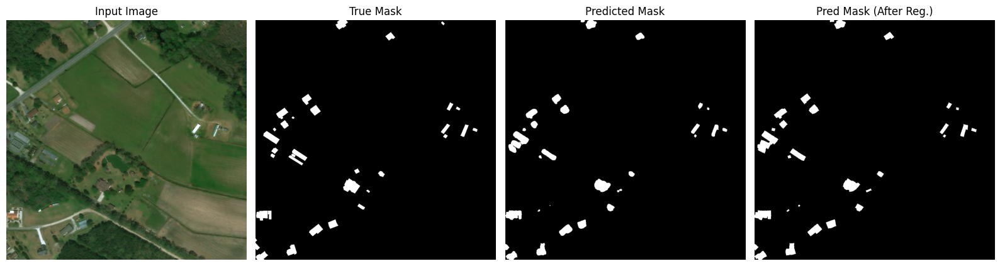

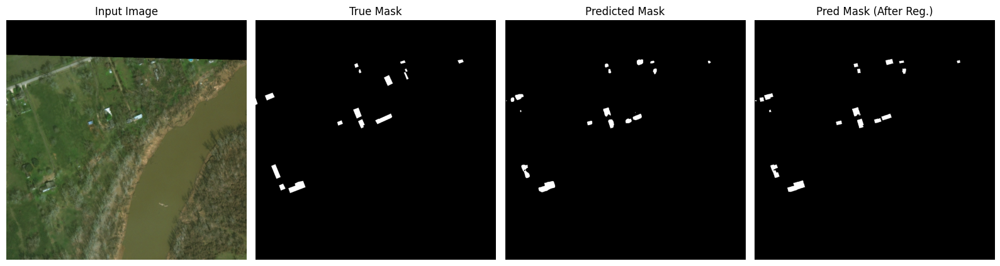

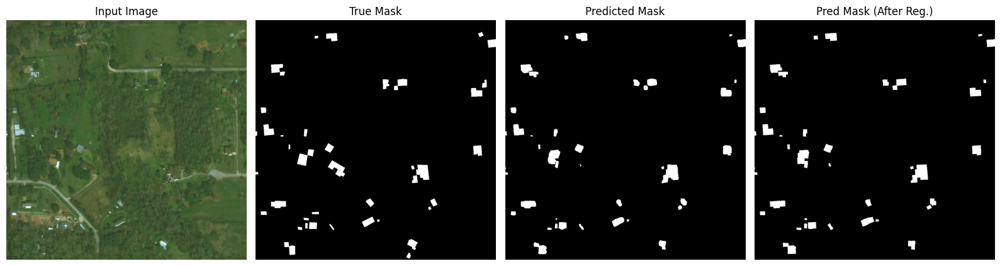

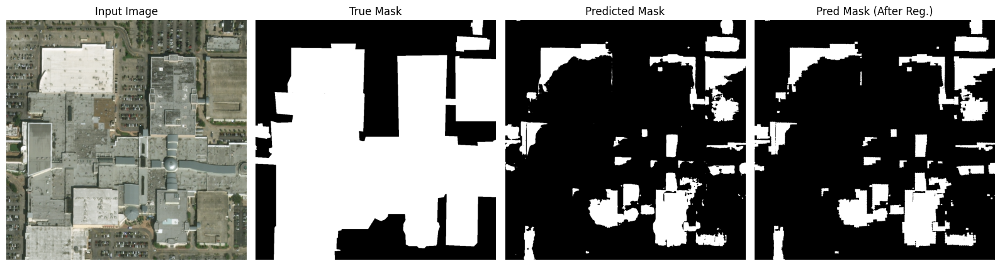

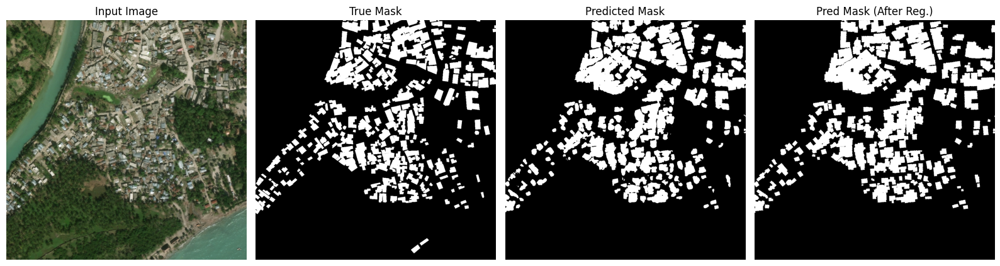

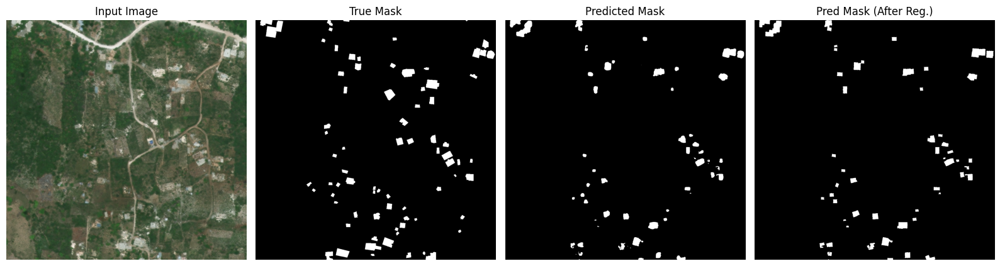

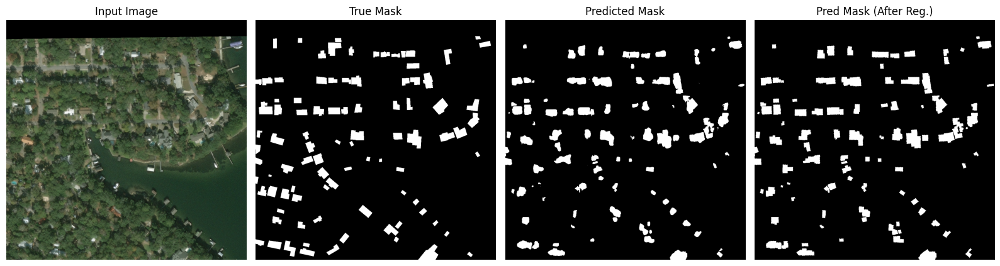

In [21]:
predictions, metrics = evaluate_model_with_regularization(model_U2net, encoder, generator, test_loader, DEVICE, [(0, 0, 0), (255, 255, 255)])

print_regularization_metrics(metrics)

visualize_predictions(predictions)